# Gas Plume Detection Pipeline
This notebook processes individual images through the detection pipeline

In [131]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from scipy import ndimage
from skimage import feature, measure, morphology

In [132]:
# Helper functions
def load_image_set(image_num, data_path='CleanImages'):
    """Load RGB, ACE, and ground truth images for a given image number."""
    base_path = Path(data_path)
    
    rgb_img = Image.open(base_path / f'{image_num}_FalseRGB.png')
    rgb_array = np.array(rgb_img)
    
    ace_img = Image.open(base_path / f'{image_num}_ACE.png')
    if ace_img.mode != 'L':
        ace_img = ace_img.convert('L')
    ace_array = np.array(ace_img)
    
    gt_img = Image.open(base_path / f'{image_num}_Real.png')
    gt_array = np.array(gt_img)
    
    return rgb_array, ace_array, gt_array


def apply_lowpass_highpass_filter(img_array, cutoff_ratio=0.1, malt=1):
    """Apply low-pass and high-pass filters, then compute clipped difference."""
    fft = np.fft.fft2(img_array)
    fft_shifted = np.fft.fftshift(fft)
    
    rows, cols = img_array.shape
    center_row, center_col = rows // 2, cols // 2
    y, x = np.ogrid[:rows, :cols]
    distance = np.sqrt((x - center_col)**2 + (y - center_row)**2)
    cutoff = cutoff_ratio * min(rows, cols)
    
    low_pass_mask = distance <= cutoff
    fft_low_pass = fft_shifted * low_pass_mask
    
    high_pass_mask = distance > cutoff
    fft_high_pass = fft_shifted * high_pass_mask
    
    img_low_pass = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_low_pass)))
    img_high_pass = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_high_pass)))
    img_difference = np.maximum(img_low_pass - img_high_pass * malt, 0)
    
    return img_low_pass, img_high_pass, img_difference

---
## PIPELINE START
---

In [133]:
# ============================================
# SELECT IMAGE TO PROCESS
# ============================================
image_num = 6  # Valid range: 1-7
# Notes: 5=stripy, 6=stripes+clouds, 3=clear plume

### Step 1: Raw Data Output

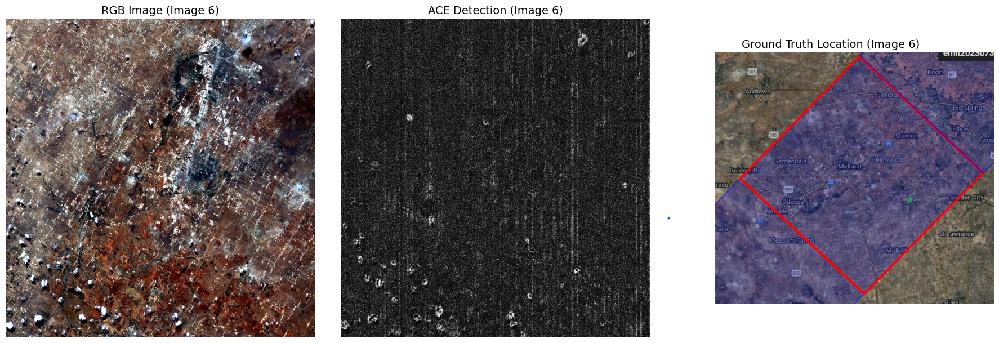

Image 6 loaded successfully
RGB shape: (1280, 1242, 4)
ACE shape: (1280, 1242)
Ground Truth shape: (525, 682, 4)


In [134]:
rgb, ace, ground_truth = load_image_set(image_num)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(rgb)
axes[0].set_title(f'RGB Image (Image {image_num})', fontsize=14)
axes[0].axis('off')

axes[1].imshow(ace, cmap='gray')
axes[1].set_title(f'ACE Detection (Image {image_num})', fontsize=14)
axes[1].axis('off')

axes[2].imshow(ground_truth)
axes[2].set_title(f'Ground Truth Location (Image {image_num})', fontsize=14)
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"Image {image_num} loaded successfully")
print(f"RGB shape: {rgb.shape}")
print(f"ACE shape: {ace.shape}")
print(f"Ground Truth shape: {ground_truth.shape}")

### Step 2: Cloud Detection and Removal

Found 4687 white blobs → 111 after size filtering


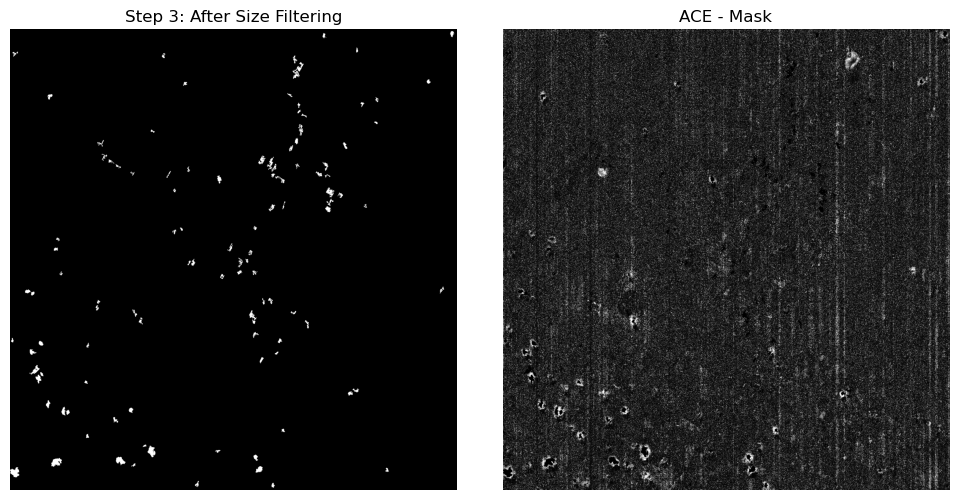

Clouds detected: 78 (8217 pixels, 0.52%)


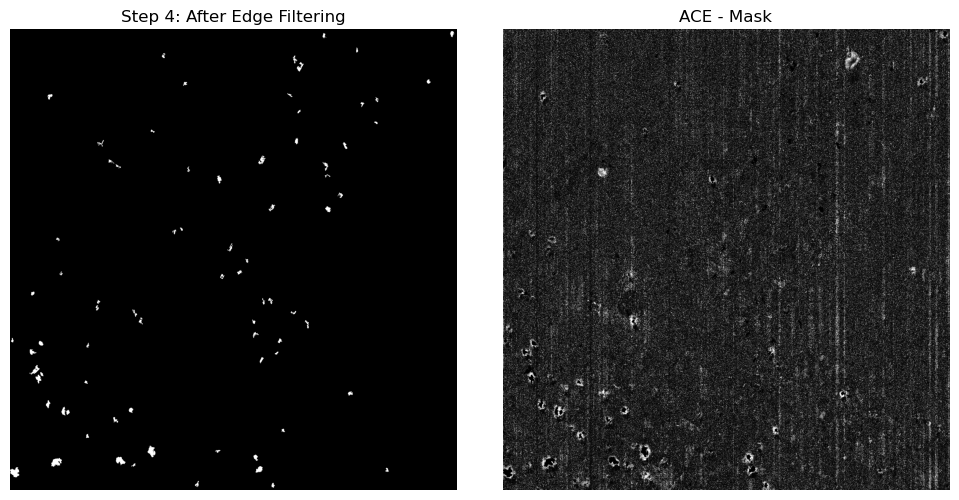

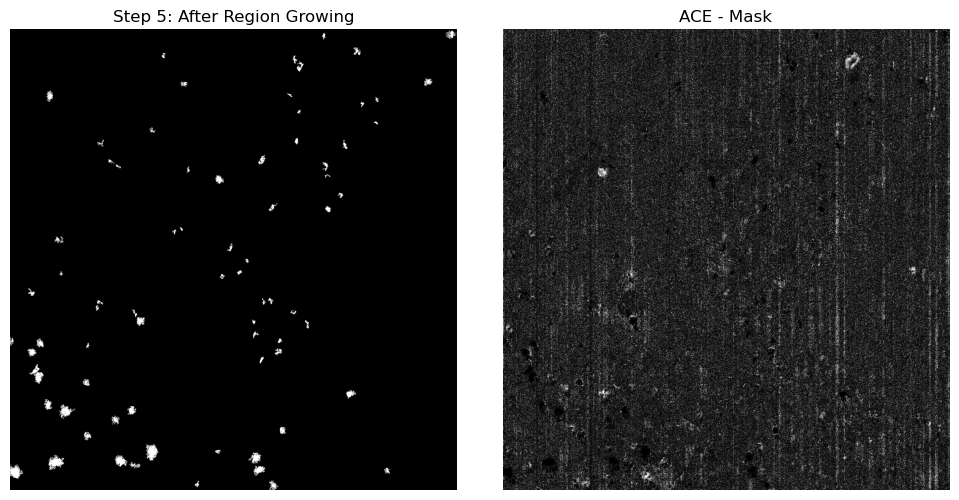

Size filtering: 75 → 44 clouds (removed 31)
Final: 13017 pixels (+4800 from RGB, +58.4%)


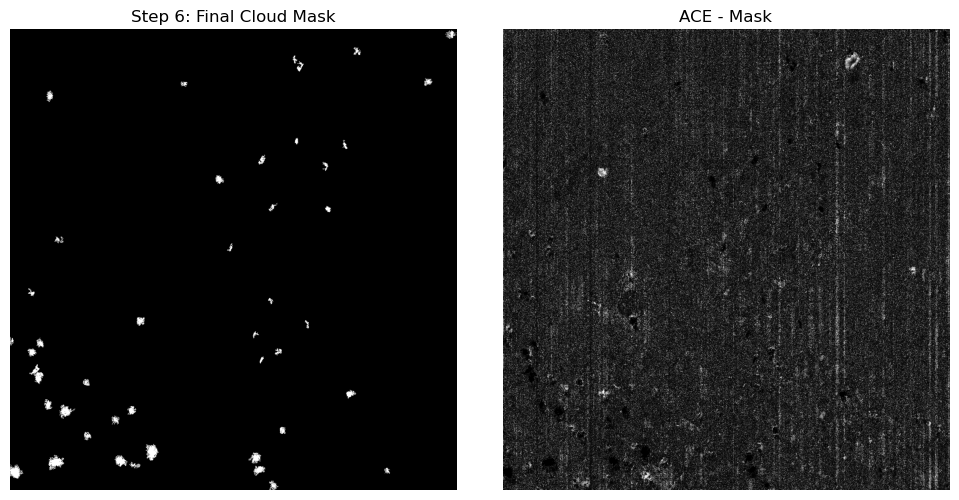

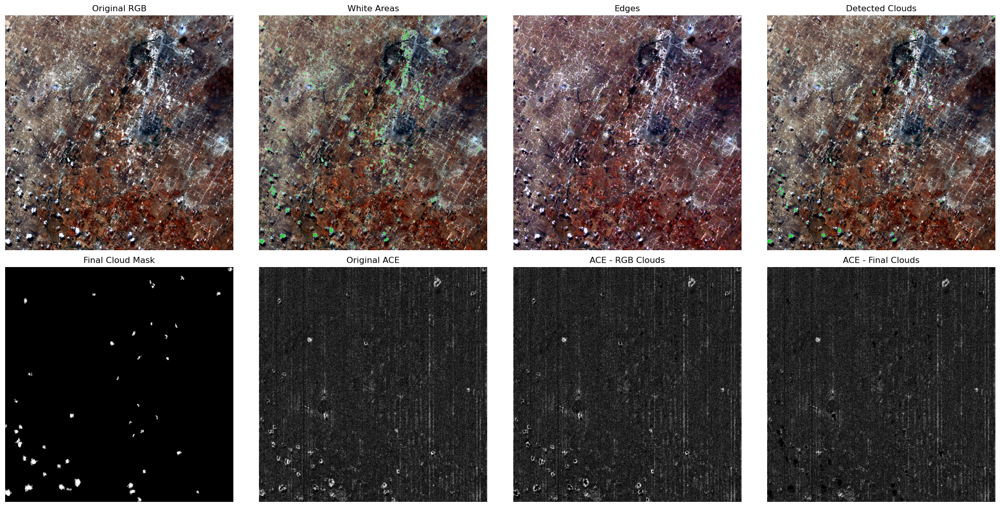

In [135]:
# ============================================
# CLOUD DETECTION PARAMETERS
# ============================================
Testing_OutPuts = True  # Enable intermediate visualizations

# RGB Cloud Detection
white_threshold = 240  # Minimum RGB value for white detection
canny_sigma = 5.0  # Gaussian sigma for edge detection
canny_low = 0.4  # Canny low threshold
canny_high = 0.5  # Canny high threshold
min_blob_size = 40  # Minimum blob size to filter RGB noise
edge_threshold_percent = 70  # Minimum % of blob perimeter with edges
edge_distance = 4  # Border thickness for edge detection

# ACE Region Growing
ace_intensity_threshold = 100  # Minimum ACE intensity for cloud region (0-255)
cloud_growth_factor = 4  # Maximum growth factor from original RGB detection
min_cloud_size = 100  # Minimum cloud size after region growing (stricter filter)

# ============================================
# STEP 1: RGB WHITE DETECTION
# ============================================
has_alpha = rgb.shape[2] == 4
rgb_no_alpha = rgb[:, :, :3] if has_alpha else rgb
white_mask = np.all(rgb_no_alpha >= white_threshold, axis=2)

# ============================================
# STEP 2: EDGE DETECTION
# ============================================
rgb_gray = np.mean(rgb_no_alpha, axis=2)
edges = feature.canny(rgb_gray, sigma=canny_sigma, low_threshold=canny_low, high_threshold=canny_high)

# ============================================
# STEP 3: SIZE FILTERING
# ============================================
labeled_blobs = measure.label(white_mask, connectivity=2)
blob_properties = measure.regionprops(labeled_blobs)
large_blobs = [prop for prop in blob_properties if prop.area >= min_blob_size]

print(f"Found {len(blob_properties)} white blobs → {len(large_blobs)} after size filtering")

if Testing_OutPuts:
    step3_mask = np.zeros_like(white_mask, dtype=bool)
    for prop in large_blobs:
        step3_mask |= (labeled_blobs == prop.label)
    
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(step3_mask, cmap='gray')
    axes[0].set_title('Step 3: After Size Filtering', fontsize=12)
    axes[0].axis('off')
    
    ace_step3 = ace.copy()
    ace_step3[step3_mask] = 0
    axes[1].imshow(ace_step3, cmap='gray')
    axes[1].set_title('ACE - Mask', fontsize=12)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

# ============================================
# STEP 4: EDGE COVERAGE FILTERING
# ============================================
cloud_mask = np.zeros_like(white_mask, dtype=bool)
clouds_detected = 0

for prop in large_blobs:
    blob = (labeled_blobs == prop.label)
    eroded = morphology.binary_erosion(blob)
    perimeter = blob & ~eroded
    perimeter_pixels = np.sum(perimeter)
    
    if perimeter_pixels == 0:
        continue
    
    dilated_perimeter = morphology.binary_dilation(perimeter, morphology.disk(edge_distance))
    perimeter_with_edges = dilated_perimeter & edges
    edge_pixels = np.sum(perimeter_with_edges)
    edge_percentage = (edge_pixels / perimeter_pixels) * 100
    
    if edge_percentage >= edge_threshold_percent:
        cloud_mask |= blob
        clouds_detected += 1

rgb_pixels = np.sum(cloud_mask)
print(f"Clouds detected: {clouds_detected} ({rgb_pixels} pixels, {100*rgb_pixels/cloud_mask.size:.2f}%)")

if Testing_OutPuts:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(cloud_mask, cmap='gray')
    axes[0].set_title('Step 4: After Edge Filtering', fontsize=12)
    axes[0].axis('off')
    
    ace_step4 = ace.copy()
    ace_step4[cloud_mask] = 0
    axes[1].imshow(ace_step4, cmap='gray')
    axes[1].set_title('ACE - Mask', fontsize=12)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

# ============================================
# STEP 5: REGION GROWING IN ACE
# ============================================
ace_no_clouds_rgb = ace.copy()
ace_no_clouds_rgb[cloud_mask] = 0

ace_no_clouds_grown = ace.copy()
expanded_cloud_mask = np.zeros_like(cloud_mask, dtype=bool)

labeled_clouds = measure.label(cloud_mask, connectivity=2)
cloud_regions = measure.regionprops(labeled_clouds)

for region in cloud_regions:
    original_size = region.area
    max_size = int(original_size * cloud_growth_factor)
    grown_region = (labeled_clouds == region.label).copy()
    current_size = original_size
    
    # Initialize edge pixels using BFS
    edge_pixels = []
    cloud_coords = np.argwhere(grown_region)
    
    for coord in cloud_coords:
        y, x = coord
        for dy in [-1, 0, 1]:
            for dx in [-1, 0, 1]:
                if dy == 0 and dx == 0:
                    continue
                ny, nx = y + dy, x + dx
                if 0 <= ny < ace.shape[0] and 0 <= nx < ace.shape[1]:
                    if not grown_region[ny, nx]:
                        edge_pixels.append((y, x))
                        break
            if (y, x) in edge_pixels:
                break
    
    edge_pixels = list(set(edge_pixels))
    visited = set(edge_pixels)
    
    # Grow region
    while edge_pixels and current_size < max_size:
        y, x = edge_pixels.pop(0)
        
        for dy in [-1, 0, 1]:
            for dx in [-1, 0, 1]:
                if dy == 0 and dx == 0:
                    continue
                
                ny, nx = y + dy, x + dx
                
                if not (0 <= ny < ace.shape[0] and 0 <= nx < ace.shape[1]):
                    continue
                
                if grown_region[ny, nx] or (ny, nx) in visited:
                    continue
                
                if ace[ny, nx] >= ace_intensity_threshold:
                    grown_region[ny, nx] = True
                    current_size += 1
                    edge_pixels.append((ny, nx))
                    visited.add((ny, nx))
                    
                    if current_size >= max_size:
                        break
            
            if current_size >= max_size:
                break
    
    expanded_cloud_mask |= grown_region

if Testing_OutPuts:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(expanded_cloud_mask, cmap='gray')
    axes[0].set_title('Step 5: After Region Growing', fontsize=12)
    axes[0].axis('off')
    
    ace_step5 = ace.copy()
    ace_step5[expanded_cloud_mask] = 0
    axes[1].imshow(ace_step5, cmap='gray')
    axes[1].set_title('ACE - Mask', fontsize=12)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

# ============================================
# STEP 6: FINAL SIZE FILTERING
# ============================================
labeled_grown_clouds = measure.label(expanded_cloud_mask, connectivity=2)
grown_cloud_properties = measure.regionprops(labeled_grown_clouds)
clouds_before_filtering = len(grown_cloud_properties)

final_cloud_mask = np.zeros_like(expanded_cloud_mask, dtype=bool)
for prop in grown_cloud_properties:
    if prop.area >= min_cloud_size:
        final_cloud_mask |= (labeled_grown_clouds == prop.label)

clouds_after_filtering = len(measure.regionprops(measure.label(final_cloud_mask, connectivity=2)))
print(f"Size filtering: {clouds_before_filtering} → {clouds_after_filtering} clouds (removed {clouds_before_filtering - clouds_after_filtering})")

ace_no_clouds_grown[final_cloud_mask] = 0

grown_pixels = np.sum(final_cloud_mask)
additional_pixels = grown_pixels - rgb_pixels
print(f"Final: {grown_pixels} pixels (+{additional_pixels} from RGB, +{100*additional_pixels/rgb_pixels:.1f}%)")

if Testing_OutPuts:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(final_cloud_mask, cmap='gray')
    axes[0].set_title('Step 6: Final Cloud Mask', fontsize=12)
    axes[0].axis('off')
    
    ace_step6 = ace.copy()
    ace_step6[final_cloud_mask] = 0
    axes[1].imshow(ace_step6, cmap='gray')
    axes[1].set_title('ACE - Mask', fontsize=12)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

expanded_cloud_mask = final_cloud_mask

# ============================================
# VISUALIZATION
# ============================================
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Visualization colors
if has_alpha:
    lime_green = np.array([50, 205, 50, 255])
    purple = np.array([128, 0, 128, 255])
else:
    lime_green = np.array([50, 205, 50])
    purple = np.array([128, 0, 128])

vis1 = rgb.copy()
vis2 = rgb.copy()
vis2[white_mask] = lime_green
vis3 = rgb.copy()
vis3[edges] = purple
vis4 = rgb.copy()
vis4[cloud_mask] = lime_green
cloud_perimeter = cloud_mask & ~morphology.binary_erosion(cloud_mask)
dilated_cloud_perimeter = morphology.binary_dilation(cloud_perimeter, morphology.disk(edge_distance))
cloud_edges = edges & dilated_cloud_perimeter
vis4[cloud_edges] = purple

axes[0, 0].imshow(vis1)
axes[0, 0].set_title('Original RGB', fontsize=12)
axes[0, 0].axis('off')

axes[0, 1].imshow(vis2)
axes[0, 1].set_title('White Areas', fontsize=12)
axes[0, 1].axis('off')

axes[0, 2].imshow(vis3)
axes[0, 2].set_title('Edges', fontsize=12)
axes[0, 2].axis('off')

axes[0, 3].imshow(vis4)
axes[0, 3].set_title('Detected Clouds', fontsize=12)
axes[0, 3].axis('off')

axes[1, 1].imshow(ace, cmap='gray')
axes[1, 1].set_title('Original ACE', fontsize=12)
axes[1, 1].axis('off')

axes[1, 0].imshow(expanded_cloud_mask, cmap='gray')
axes[1, 0].set_title('Final Cloud Mask', fontsize=12)
axes[1, 0].axis('off')

axes[1, 2].imshow(ace_no_clouds_rgb, cmap='gray')
axes[1, 2].set_title('ACE - RGB Clouds', fontsize=12)
axes[1, 2].axis('off')

axes[1, 3].imshow(ace_no_clouds_grown, cmap='gray')
axes[1, 3].set_title('ACE - Final Clouds', fontsize=12)
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

### Step 3: Low-Pass / High-Pass Filtering

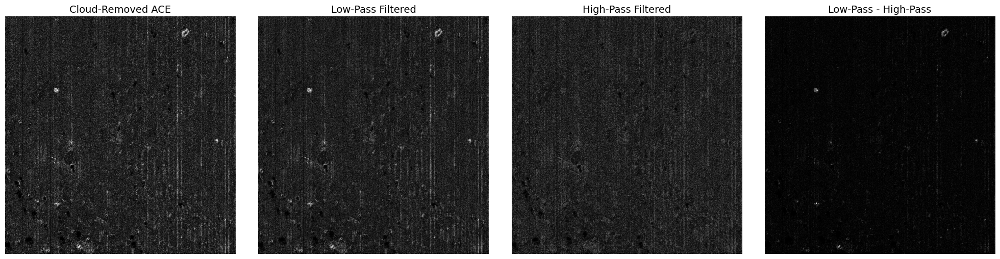

Filtering: cutoff_ratio=0.15, malt=1.5


In [136]:
# ============================================
# FREQUENCY FILTERING PARAMETERS
# ============================================
cutoff_ratio = 0.15  # Cutoff ratio for frequency filtering
malt = 1.5  # High-pass multiplier

low_pass, high_pass, filtered_ace = apply_lowpass_highpass_filter(ace_no_clouds_grown, cutoff_ratio=cutoff_ratio, malt=malt)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(ace_no_clouds_grown, cmap='gray')
axes[0].set_title('Cloud-Removed ACE', fontsize=14)
axes[0].axis('off')

axes[1].imshow(low_pass, cmap='gray')
axes[1].set_title('Low-Pass Filtered', fontsize=14)
axes[1].axis('off')

axes[2].imshow(high_pass, cmap='gray')
axes[2].set_title('High-Pass Filtered', fontsize=14)
axes[2].axis('off')

axes[3].imshow(filtered_ace, cmap='gray')
axes[3].set_title('Low-Pass - High-Pass', fontsize=14)
axes[3].axis('off')

plt.tight_layout()
plt.show()

print(f"Filtering: cutoff_ratio={cutoff_ratio}, malt={malt}")

### Sanity Check: Processing Stages Overlay

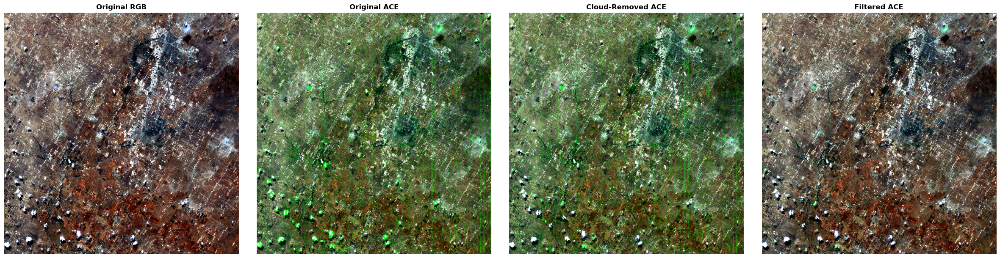

In [137]:
# Overlay ACE values on RGB using color blending
# ACE intensity controls blend between RGB and target color

target_color = np.array([0, 255, 0])  # Bright green

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

rgb_display = rgb[:, :, :3] if rgb.shape[2] == 4 else rgb
rgb_display = rgb_display.astype(float)

# Normalize ACE maps to 0-1
ace_norm = (ace - ace.min()) / (ace.max() - ace.min()) if ace.max() > ace.min() else np.zeros_like(ace)
ace_no_clouds_norm = (ace_no_clouds_grown - ace_no_clouds_grown.min()) / (ace_no_clouds_grown.max() - ace_no_clouds_grown.min()) if ace_no_clouds_grown.max() > ace_no_clouds_grown.min() else np.zeros_like(ace_no_clouds_grown)
filtered_ace_norm = (filtered_ace - filtered_ace.min()) / (filtered_ace.max() - filtered_ace.min()) if filtered_ace.max() > filtered_ace.min() else np.zeros_like(filtered_ace)

def blend_with_ace(rgb_img, ace_weight, target_color):
    """Blend RGB with target color using ACE intensity as weight."""
    weight_3d = np.stack([ace_weight, ace_weight, ace_weight], axis=2)
    blended = (1 - weight_3d) * rgb_img + weight_3d * target_color
    return np.clip(blended, 0, 255).astype(np.uint8)

axes[0].imshow(rgb)
axes[0].set_title('Original RGB', fontsize=12, fontweight='bold')
axes[0].axis('off')

blend_ace = blend_with_ace(rgb_display, ace_norm, target_color)
axes[1].imshow(blend_ace)
axes[1].set_title('Original ACE', fontsize=12, fontweight='bold')
axes[1].axis('off')

blend_no_clouds = blend_with_ace(rgb_display, ace_no_clouds_norm, target_color)
axes[2].imshow(blend_no_clouds)
axes[2].set_title('Cloud-Removed ACE', fontsize=12, fontweight='bold')
axes[2].axis('off')

blend_filtered = blend_with_ace(rgb_display, filtered_ace_norm, target_color)
axes[3].imshow(blend_filtered)
axes[3].set_title('Filtered ACE', fontsize=12, fontweight='bold')
axes[3].axis('off')

plt.tight_layout()
plt.show()

---
## DETECTION
---

### Step 4: Blob Detection with Multiple Parameter Presets

In [138]:
import cv2

# ============================================
# BLOB DETECTION PARAMETERS
# ============================================
detection_color = np.array([255, 0, 0])  # Red

# Preset 1: LOOSE - Catch anything that might be a plume
params_loose = cv2.SimpleBlobDetector_Params()
params_loose.minThreshold = 10
params_loose.maxThreshold = 255
params_loose.filterByArea = True
params_loose.minArea = 50
params_loose.maxArea = 50000
params_loose.filterByCircularity = False
params_loose.filterByConvexity = False
params_loose.filterByInertia = False

# Preset 2: TIGHT - Confident detections only
params_tight = cv2.SimpleBlobDetector_Params()
params_tight.minThreshold = 50
params_tight.maxThreshold = 255
params_tight.filterByArea = True
params_tight.minArea = 200
params_tight.maxArea = 10000
params_tight.filterByCircularity = True
params_tight.minCircularity = 0.3
params_tight.filterByConvexity = True
params_tight.minConvexity = 0.5
params_tight.filterByInertia = False

# Preset 3: LARGE BLOBS - Big plumes
params_large = cv2.SimpleBlobDetector_Params()
params_large.minThreshold = 10
params_large.maxThreshold = 255
params_large.filterByArea = True
params_large.minArea = 1000
params_large.maxArea = 100000
params_large.filterByCircularity = False
params_large.filterByConvexity = False
params_large.filterByInertia = False

# Preset 4: SMALL BLOBS - Small plumes
params_small = cv2.SimpleBlobDetector_Params()
params_small.minThreshold = 10
params_small.maxThreshold = 255
params_small.filterByArea = True
params_small.minArea = 20
params_small.maxArea = 500
params_small.filterByCircularity = False
params_small.filterByConvexity = False
params_small.filterByInertia = False

# Preset 5: ELONGATED - Wind-stretched plumes
params_elongated = cv2.SimpleBlobDetector_Params()
params_elongated.minThreshold = 10
params_elongated.maxThreshold = 255
params_elongated.filterByArea = True
params_elongated.minArea = 100
params_elongated.maxArea = 50000
params_elongated.filterByCircularity = True
params_elongated.minCircularity = 0.01
params_elongated.maxCircularity = 0.5
params_elongated.filterByConvexity = False
params_elongated.filterByInertia = True
params_elongated.minInertiaRatio = 0.01
params_elongated.maxInertiaRatio = 0.5

# Run detection with all presets
filtered_ace_uint8 = ((filtered_ace - filtered_ace.min()) / (filtered_ace.max() - filtered_ace.min()) * 255).astype(np.uint8)

param_sets = {
    'Loose': params_loose,
    'Tight': params_tight,
    'Large Blobs': params_large,
    'Small Blobs': params_small,
    'Elongated': params_elongated
}

detection_results = {}
for name, params in param_sets.items():
    detector = cv2.SimpleBlobDetector_create(params)
    keypoints = detector.detect(filtered_ace_uint8)
    detection_results[name] = keypoints
    print(f"{name}: {len(keypoints)} blobs")

print(f"\nTotal presets: {len(param_sets)}")

Loose: 4 blobs
Tight: 0 blobs
Large Blobs: 1 blobs
Small Blobs: 28 blobs
Elongated: 1 blobs

Total presets: 5


### Visualization: Detected Blobs on Filtered ACE

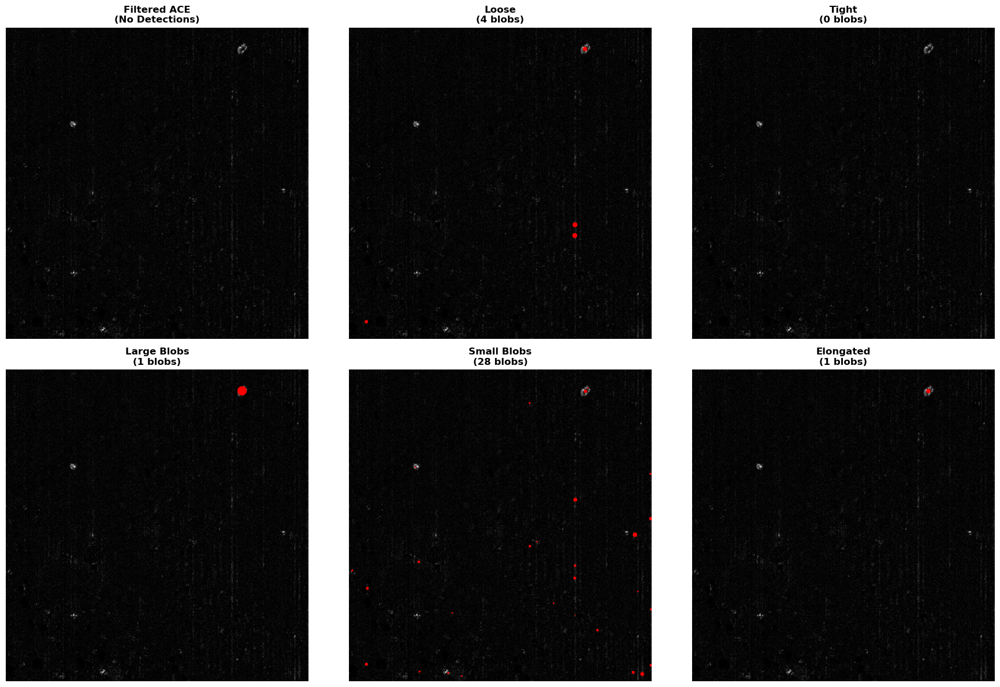

In [139]:
num_presets = len(param_sets)
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

axes[0].imshow(filtered_ace, cmap='gray')
axes[0].set_title('Filtered ACE\n(No Detections)', fontsize=12, fontweight='bold')
axes[0].axis('off')

def create_blob_visualization(ace_img, keypoints, color):
    """Create visualization with detected blobs highlighted."""
    ace_rgb = np.stack([ace_img, ace_img, ace_img], axis=2)
    blob_mask = np.zeros(ace_img.shape, dtype=bool)
    
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        radius = int(kp.size / 2)
        y_coords, x_coords = np.ogrid[:ace_img.shape[0], :ace_img.shape[1]]
        circle_mask = (x_coords - x)**2 + (y_coords - y)**2 <= radius**2
        blob_mask |= circle_mask
    
    ace_rgb[blob_mask] = color
    return ace_rgb.astype(np.uint8)

for idx, (name, keypoints) in enumerate(detection_results.items(), start=1):
    visualization = create_blob_visualization(filtered_ace_uint8, keypoints, detection_color)
    axes[idx].imshow(visualization)
    axes[idx].set_title(f'{name}\n({len(keypoints)} blobs)', fontsize=12, fontweight='bold')
    axes[idx].axis('off')

plt.tight_layout()
plt.show()